In [1]:
import cv2
import numpy as np
import pandas as pd
from skimage.metrics import peak_signal_noise_ratio, mean_squared_error, structural_similarity
import matplotlib.pyplot as plt

array_results = []


def store_metrics_result(column_name: str, result: tuple):
    stored = ['', [], []]

    stored[0] = column_name

    for i in range(len(result)):
        stored[1].append(result[i][0])
        stored[2].append(result[i][1])

    array_results.append(stored)


def calculate_metrics(image1_path, image2_path):
    image1 = cv2.imread(f"/data/notebook_files/{image1_path}")
    image2 = cv2.imread(f"/data/notebook_files/{image2_path}")
    mse = mean_squared_error(image1, image2)
    psnr = peak_signal_noise_ratio(image1, image2, data_range=255)
    return mse, psnr


def metric_string(metric):
    if type(metric) is tuple:
        (mse, psnr) = metric
        return f"MSE: {mse:.10f}\nPSNR: {psnr:.10f}"
    return metric


def show_images(image_path: list, title_list: list, subtitle: list, plot_title: str, title_padding=0.0,
                stats_padding=0.0):
    fig = plt.figure(figsize=(15, 4), constrained_layout=True)

    aspect_ratio = 0.0
    y0_min = 0
    y1_max = 0
    columns = 5
    rows = 1
    skip_first_subtitle = False
    for imageIndex in range(len(image_path)):
        img_raw = cv2.imread(f"/data/notebook_files/{image_path[imageIndex]}")
        img = cv2.cvtColor(img_raw, cv2.COLOR_BGR2RGB)
        ax = fig.add_subplot(rows, columns, imageIndex + 1)
        height, width, channels = img.shape
        aspect_ratio = width / height

        ax.title.set_text(title_list[imageIndex])
        axes_position = ax.get_position()
        if len(image_path) == len(subtitle) and imageIndex == 0:
            skip_first_subtitle = True
            plt.imshow(img)
            y1_max = axes_position.y1
            y0_min = axes_position.y0
            continue
        if imageIndex != 0:
            reducer = 0.0
            if 0.9 < aspect_ratio < 1.1:
                reducer = 0.16
            # Landscape
            elif aspect_ratio > 1.0:
                reducer = 0.4
            # Potrait
            elif aspect_ratio < 1.0:
                reducer = 0.05

            # Set automatic stats padding
            if aspect_ratio == 1.25:
                stats_padding = -0.175
                title_padding = 0.015
            elif aspect_ratio == 0.666:
                title_padding = -0.075
                stats_padding = 0.04
            elif aspect_ratio == 0.668:
                title_padding = -0.06
                stats_padding = 0.025
            elif aspect_ratio == 1.0666666666666667:
                title_padding = -0.0525
                stats_padding = 0.025
            elif aspect_ratio == 0.7479166666666667:
                title_padding = -0.08
                stats_padding = 0.035
            elif aspect_ratio == 0.75:
                title_padding = -0.05
                stats_padding = 0.03
            elif aspect_ratio == 1.8618181818181818:
                title_padding = -0.05
            elif aspect_ratio == 0.836:
                title_padding = -0.11
                stats_padding = 0.05
            elif aspect_ratio == 1.3333333333333333:
                title_padding = 0.0075
                stats_padding = -0.125
            elif aspect_ratio == 1.7777777777777777:
                title_padding = -0.05

            stats_subtitle = metric_string(subtitle[imageIndex if skip_first_subtitle else imageIndex - 1])
            fig.text(
                0.5,
                -y0_min - reducer - stats_padding,
                stats_subtitle,
                size=12,
                ha="center",
                transform=ax.transAxes
            )

        plt.imshow(img)
        y1_max = axes_position.y1
        y0_min = axes_position.y0

    base_add = 0.0
    if 0.9 < aspect_ratio < 1.1:
        base_add = 0.07
    elif aspect_ratio > 1.0:
        base_add = -0.025
    elif aspect_ratio < 1.0:
        base_add = 0.25

    fig.text(0.5, y1_max + base_add + title_padding, plot_title, horizontalalignment='center', fontsize=20)

    fig.text(0.5, y1_max + base_add + title_padding + 0.05, "     ")

    plt.show()

In [2]:
from os import walk

original_f = []
mod50_f = []
mod300_f = []
mod600_f = []
mod1200_f = []

for (dirPath, dirnames, filenames) in walk("original/"):
    original_f.extend(filenames)
    break
original_f.sort(key=str.casefold)

for i in range(len(original_f)):
    mod50_f.append(f"modified_50/{original_f[i].split('.')[0]}.jpg")
    mod300_f.append(f"modified_300/{original_f[i].split('.')[0]}.jpg")
    mod600_f.append(f"modified_600/{original_f[i].split('.')[0]}.jpg")
    mod1200_f.append(f"modified_1200/{original_f[i].split('.')[0]}.jpg")
    original_f[i] = f"original/{original_f[i]}"

for i in range(len(original_f)):
    print(original_f[i])

original/airplane.bmp
original/airship.jpg
original/bagel.jpg
original/basketball.jpg
original/bookshop.jpg
original/cablecar.bmp
original/cannon.jpg
original/car.jpg
original/Carrena, Spain.png
original/chicken.jpg
original/cornfield.bmp
original/daisy.jpg
original/dam.jpg
original/Darfield, New Zealand.png
original/drum.jpg
original/Earth.bmp
original/East Chevington, United Kingdom.png
original/fruits.bmp
original/girl.bmp
original/Golden Valley, United States.png
original/goldfish.jpg
original/goldhill.bmp
original/Kawaguchi Lake, Japan.png
original/Laufskalavarda, Iceland.png
original/macaw.jpg
original/Malamute.bmp
original/Mars.bmp
original/Mercury.bmp
original/Moena, Italy.png
original/monarch.bmp
original/mountain_bike.jpg
original/Muriwai Beach, New Zealand.png
original/Patagonia National Park.png
original/pens.bmp
original/Rainier.bmp
original/robin.jpg
original/Sedona, United States.png
original/soccer.bmp
original/Stair of the Turks, Turkey.png
original/table.jpg
original/

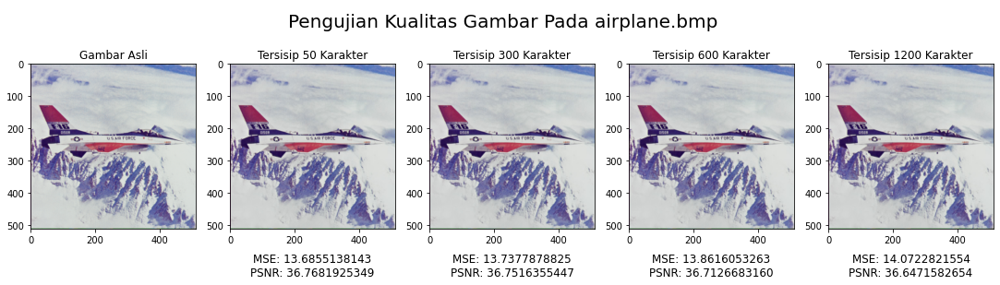

In [3]:
filename = original_f[0][9:]
metrics_50 = calculate_metrics(original_f[0], mod50_f[0])
metrics_300 = calculate_metrics(original_f[0], mod300_f[0])
metrics_600 = calculate_metrics(original_f[0], mod600_f[0])
metrics_1200 = calculate_metrics(original_f[0], mod1200_f[0])
show_images(image_path=(original_f[0], mod50_f[0], mod300_f[0], mod600_f[0], mod1200_f[0]),
            title_list=[f"Gambar Asli", f"Tersisip 50 Karakter", f"Tersisip 300 Karakter", f"Tersisip 600 Karakter",
                        f"Tersisip 1200 Karakter"],
            subtitle=[metrics_50, metrics_300, metrics_600, metrics_1200],
            plot_title=f"Pengujian Kualitas Gambar Pada {filename}")
store_metrics_result(filename, result=[metrics_50, metrics_300, metrics_600, metrics_1200])

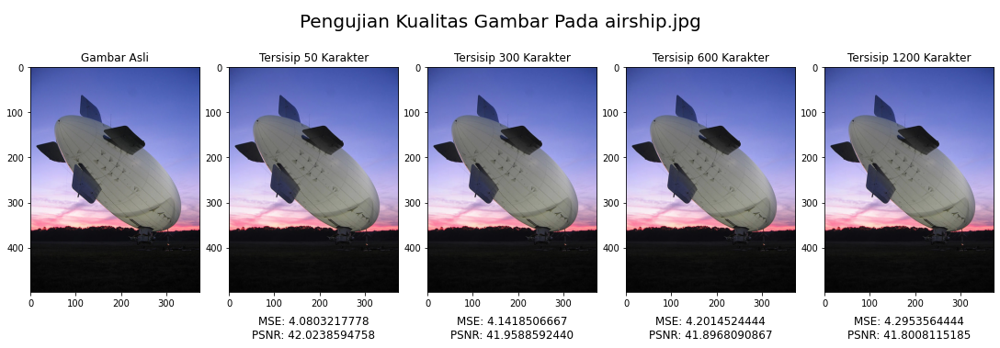

In [4]:
filename = original_f[1][9:]
metrics_50 = calculate_metrics(original_f[1], mod50_f[1])
metrics_300 = calculate_metrics(original_f[1], mod300_f[1])
metrics_600 = calculate_metrics(original_f[1], mod600_f[1])
metrics_1200 = calculate_metrics(original_f[1], mod1200_f[1])
store_metrics_result(filename, result=(metrics_50, metrics_300, metrics_600, metrics_1200))
show_images(image_path=[original_f[1], mod50_f[1], mod300_f[1], mod600_f[1], mod1200_f[1]],
            title_list=[f"Gambar Asli", f"Tersisip 50 Karakter", f"Tersisip 300 Karakter", f"Tersisip 600 Karakter",
                        f"Tersisip 1200 Karakter"], subtitle=[metrics_50, metrics_300, metrics_600, metrics_1200],
            plot_title=f"Pengujian Kualitas Gambar Pada {filename}")

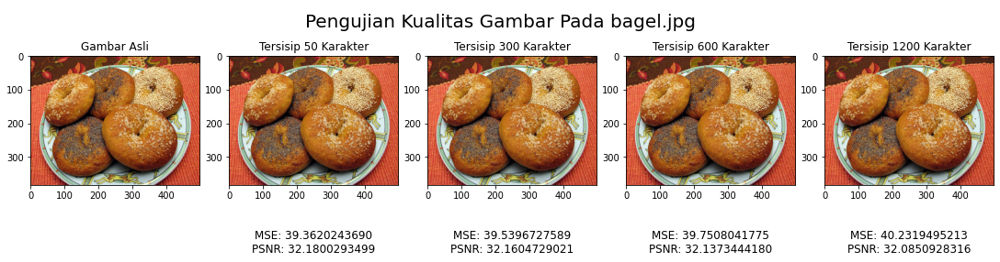

In [5]:
filename = original_f[2][9:]
metrics_50 = calculate_metrics(original_f[2], mod50_f[2])
metrics_300 = calculate_metrics(original_f[2], mod300_f[2])
metrics_600 = calculate_metrics(original_f[2], mod600_f[2])
metrics_1200 = calculate_metrics(original_f[2], mod1200_f[2])
store_metrics_result(filename, result=(metrics_50, metrics_300, metrics_600, metrics_1200))
show_images(image_path=[original_f[2], mod50_f[2], mod300_f[2], mod600_f[2], mod1200_f[2]],
            title_list=[f"Gambar Asli", f"Tersisip 50 Karakter", f"Tersisip 300 Karakter", f"Tersisip 600 Karakter",
                        f"Tersisip 1200 Karakter"], subtitle=[metrics_50, metrics_300, metrics_600, metrics_1200],
            plot_title=f"Pengujian Kualitas Gambar Pada {filename}")

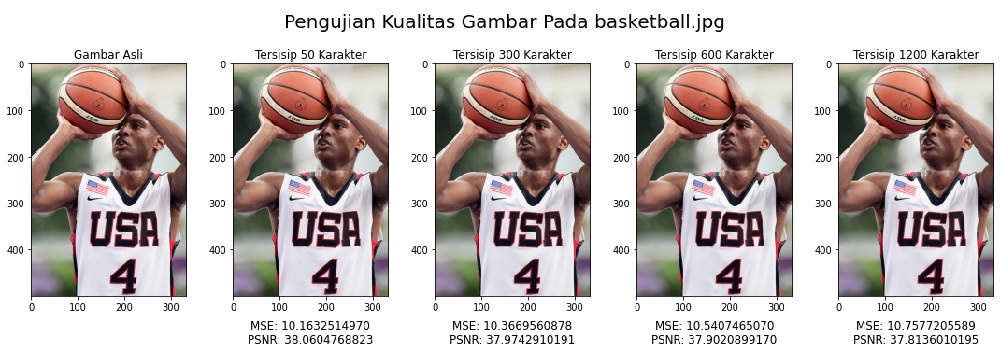

In [6]:
filename = original_f[3][9:]
metrics_50 = calculate_metrics(original_f[3], mod50_f[3])
metrics_300 = calculate_metrics(original_f[3], mod300_f[3])
metrics_600 = calculate_metrics(original_f[3], mod600_f[3])
metrics_1200 = calculate_metrics(original_f[3], mod1200_f[3])
store_metrics_result(filename, result=(metrics_50, metrics_300, metrics_600, metrics_1200))
show_images(image_path=[original_f[3], mod50_f[3], mod300_f[3], mod600_f[3], mod1200_f[3]],
            title_list=[f"Gambar Asli", f"Tersisip 50 Karakter", f"Tersisip 300 Karakter", f"Tersisip 600 Karakter",
                        f"Tersisip 1200 Karakter"], subtitle=[metrics_50, metrics_300, metrics_600, metrics_1200],
            plot_title=f"Pengujian Kualitas Gambar Pada {filename}")

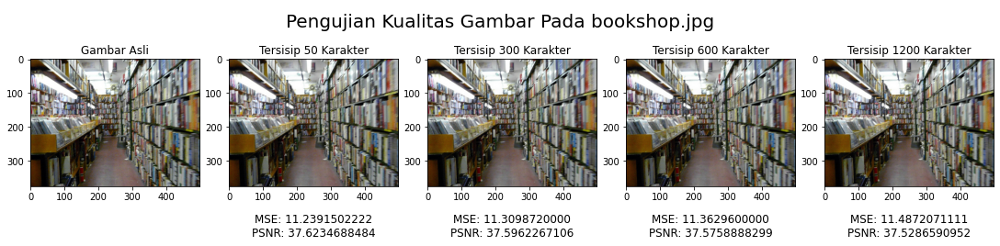

In [7]:
filename = original_f[4][9:]
metrics_50 = calculate_metrics(original_f[4], mod50_f[4])
metrics_300 = calculate_metrics(original_f[4], mod300_f[4])
metrics_600 = calculate_metrics(original_f[4], mod600_f[4])
metrics_1200 = calculate_metrics(original_f[4], mod1200_f[4])
store_metrics_result(filename, result=(metrics_50, metrics_300, metrics_600, metrics_1200))
show_images(
    image_path=[original_f[4], mod50_f[4], mod300_f[4], mod600_f[4], mod1200_f[4]],
    title_list=[f"Gambar Asli", f"Tersisip 50 Karakter", f"Tersisip 300 Karakter", f"Tersisip 600 Karakter",
                f"Tersisip 1200 Karakter"],
    subtitle=[metrics_50, metrics_300, metrics_600, metrics_1200],
    plot_title=f"Pengujian Kualitas Gambar Pada {filename}",
)

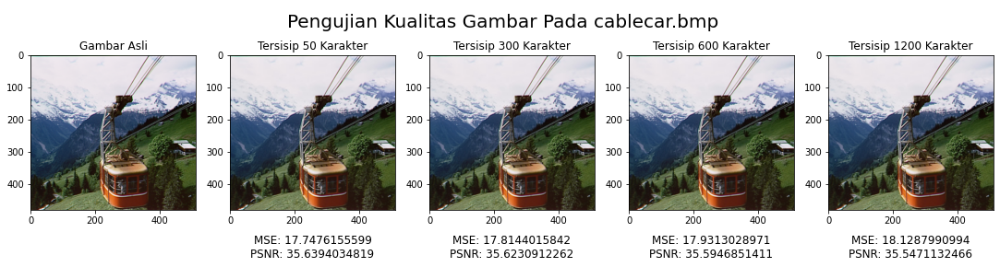

In [8]:
filename = original_f[5][9:]
metrics_50 = calculate_metrics(original_f[5], mod50_f[5])
metrics_300 = calculate_metrics(original_f[5], mod300_f[5])
metrics_600 = calculate_metrics(original_f[5], mod600_f[5])
metrics_1200 = calculate_metrics(original_f[5], mod1200_f[5])
store_metrics_result(filename, result=(metrics_50, metrics_300, metrics_600, metrics_1200))
show_images(
    image_path=[original_f[5], mod50_f[5], mod300_f[5], mod600_f[5], mod1200_f[5]],
    title_list=[f"Gambar Asli", f"Tersisip 50 Karakter", f"Tersisip 300 Karakter", f"Tersisip 600 Karakter",
                f"Tersisip 1200 Karakter"],
    subtitle=[metrics_50, metrics_300, metrics_600, metrics_1200],
    plot_title=f"Pengujian Kualitas Gambar Pada {filename}",
)

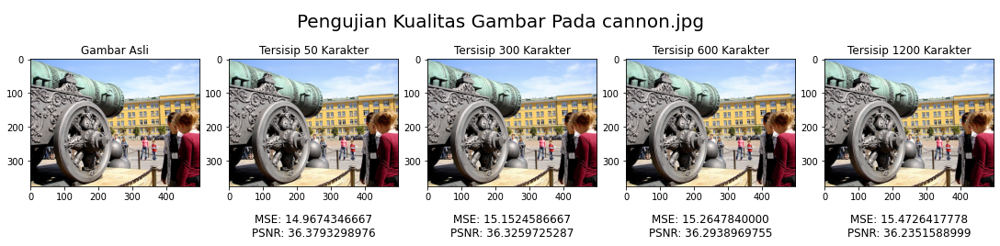

In [9]:
filename = original_f[6][9:]
metrics_50 = calculate_metrics(original_f[6], mod50_f[6])
metrics_300 = calculate_metrics(original_f[6], mod300_f[6])
metrics_600 = calculate_metrics(original_f[6], mod600_f[6])
metrics_1200 = calculate_metrics(original_f[6], mod1200_f[6])
store_metrics_result(filename, result=(metrics_50, metrics_300, metrics_600, metrics_1200))
show_images(
    image_path=[original_f[6], mod50_f[6], mod300_f[6], mod600_f[6], mod1200_f[6]],
    title_list=[f"Gambar Asli", f"Tersisip 50 Karakter", f"Tersisip 300 Karakter", f"Tersisip 600 Karakter",
                f"Tersisip 1200 Karakter"],
    subtitle=[metrics_50, metrics_300, metrics_600, metrics_1200],
    plot_title=f"Pengujian Kualitas Gambar Pada {filename}"
)

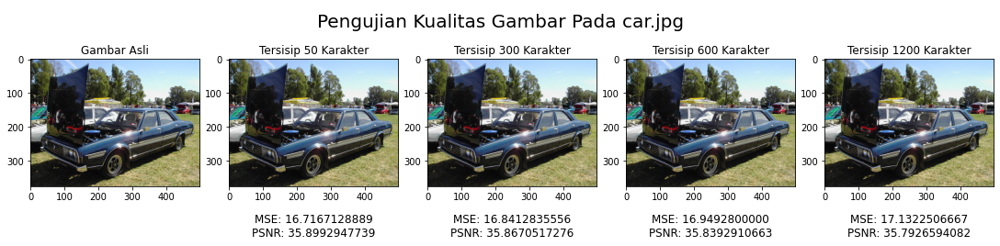

In [10]:
filename = original_f[7][9:]
metrics_50 = calculate_metrics(original_f[7], mod50_f[7])
metrics_300 = calculate_metrics(original_f[7], mod300_f[7])
metrics_600 = calculate_metrics(original_f[7], mod600_f[7])
metrics_1200 = calculate_metrics(original_f[7], mod1200_f[7])
store_metrics_result(filename, result=(metrics_50, metrics_300, metrics_600, metrics_1200))
show_images(
    image_path=[original_f[7], mod50_f[7], mod300_f[7], mod600_f[7], mod1200_f[7]],
    title_list=[f"Gambar Asli", f"Tersisip 50 Karakter", f"Tersisip 300 Karakter", f"Tersisip 600 Karakter",
                f"Tersisip 1200 Karakter"],
    subtitle=[metrics_50, metrics_300, metrics_600, metrics_1200],
    plot_title=f"Pengujian Kualitas Gambar Pada {filename}"
)

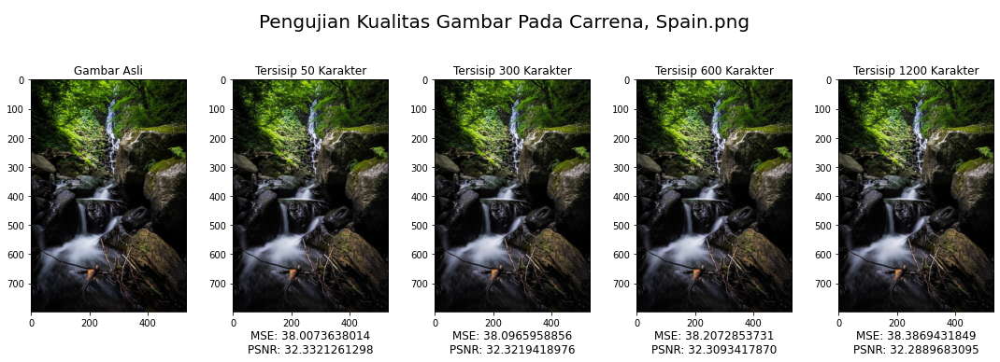

In [11]:
filename = original_f[8][9:]
metrics_50 = calculate_metrics(original_f[8], mod50_f[8])
metrics_300 = calculate_metrics(original_f[8], mod300_f[8])
metrics_600 = calculate_metrics(original_f[8], mod600_f[8])
metrics_1200 = calculate_metrics(original_f[8], mod1200_f[8])
store_metrics_result(filename, result=(metrics_50, metrics_300, metrics_600, metrics_1200))
show_images(
    image_path=[original_f[8], mod50_f[8], mod300_f[8], mod600_f[8], mod1200_f[8]],
    title_list=[f"Gambar Asli", f"Tersisip 50 Karakter", f"Tersisip 300 Karakter", f"Tersisip 600 Karakter",
                f"Tersisip 1200 Karakter"],
    subtitle=[metrics_50, metrics_300, metrics_600, metrics_1200],
    plot_title=f"Pengujian Kualitas Gambar Pada {filename}"
)

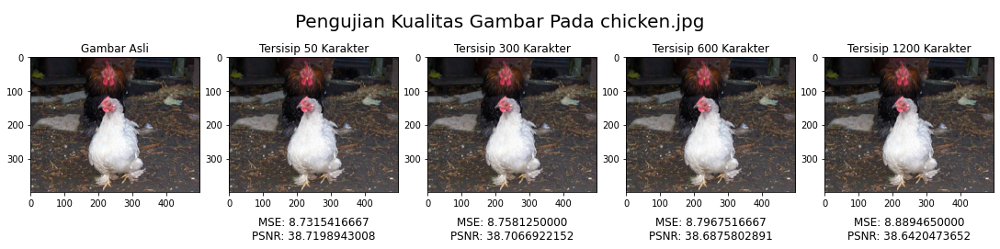

In [12]:
filename = original_f[9][9:]
metrics_50 = calculate_metrics(original_f[9], mod50_f[9])
metrics_300 = calculate_metrics(original_f[9], mod300_f[9])
metrics_600 = calculate_metrics(original_f[9], mod600_f[9])
metrics_1200 = calculate_metrics(original_f[9], mod1200_f[9])
store_metrics_result(filename, result=(metrics_50, metrics_300, metrics_600, metrics_1200))
show_images(
    image_path=[original_f[9], mod50_f[9], mod300_f[9], mod600_f[9], mod1200_f[9]],
    title_list=[f"Gambar Asli", f"Tersisip 50 Karakter", f"Tersisip 300 Karakter", f"Tersisip 600 Karakter",
                f"Tersisip 1200 Karakter"],
    subtitle=[metrics_50, metrics_300, metrics_600, metrics_1200],
    plot_title=f"Pengujian Kualitas Gambar Pada {filename}"
)

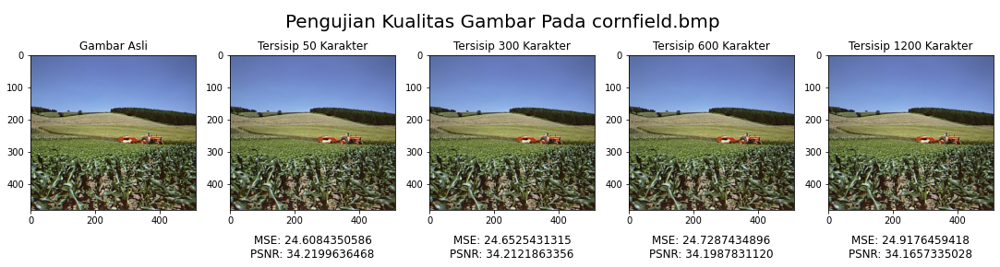

In [13]:
filename = original_f[10][9:]
metrics_50 = calculate_metrics(original_f[10], mod50_f[10])
metrics_300 = calculate_metrics(original_f[10], mod300_f[10])
metrics_600 = calculate_metrics(original_f[10], mod600_f[10])
metrics_1200 = calculate_metrics(original_f[10], mod1200_f[10])
store_metrics_result(filename, result=(metrics_50, metrics_300, metrics_600, metrics_1200))
show_images(
    image_path=[original_f[10], mod50_f[10], mod300_f[10], mod600_f[10], mod1200_f[10]],
    title_list=[f"Gambar Asli", f"Tersisip 50 Karakter", f"Tersisip 300 Karakter", f"Tersisip 600 Karakter",
                f"Tersisip 1200 Karakter"],
    subtitle=[metrics_50, metrics_300, metrics_600, metrics_1200],
    plot_title=f"Pengujian Kualitas Gambar Pada {filename}",
)

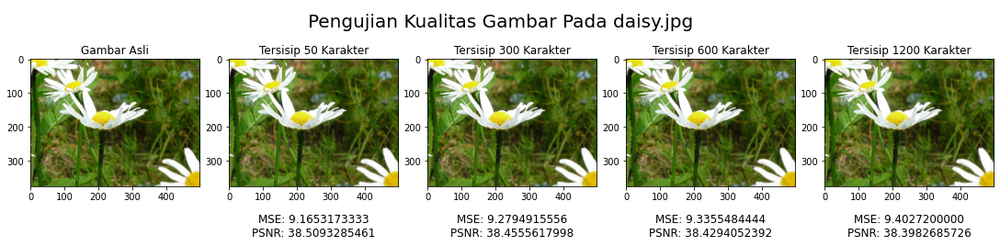

In [14]:
filename = original_f[11][9:]
metrics_50 = calculate_metrics(original_f[11], mod50_f[11])
metrics_300 = calculate_metrics(original_f[11], mod300_f[11])
metrics_600 = calculate_metrics(original_f[11], mod600_f[11])
metrics_1200 = calculate_metrics(original_f[11], mod1200_f[11])
store_metrics_result(filename, result=(metrics_50, metrics_300, metrics_600, metrics_1200))
show_images(
    image_path=[original_f[11], mod50_f[11], mod300_f[11], mod600_f[11], mod1200_f[11]],
    title_list=[f"Gambar Asli", f"Tersisip 50 Karakter", f"Tersisip 300 Karakter", f"Tersisip 600 Karakter",
                f"Tersisip 1200 Karakter"],
    subtitle=[metrics_50, metrics_300, metrics_600, metrics_1200],
    plot_title=f"Pengujian Kualitas Gambar Pada {filename}"
)

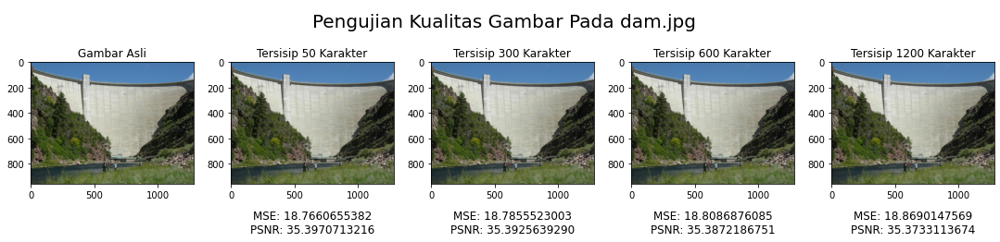

In [15]:
filename = original_f[12][9:]
metrics_50 = calculate_metrics(original_f[12], mod50_f[12])
metrics_300 = calculate_metrics(original_f[12], mod300_f[12])
metrics_600 = calculate_metrics(original_f[12], mod600_f[12])
metrics_1200 = calculate_metrics(original_f[12], mod1200_f[12])
store_metrics_result(filename, result=(metrics_50, metrics_300, metrics_600, metrics_1200))
show_images(
    image_path=[original_f[12], mod50_f[12], mod300_f[12], mod600_f[12], mod1200_f[12]],
    title_list=[f"Gambar Asli", f"Tersisip 50 Karakter", f"Tersisip 300 Karakter", f"Tersisip 600 Karakter",
                f"Tersisip 1200 Karakter"],
    subtitle=[metrics_50, metrics_300, metrics_600, metrics_1200],
    plot_title=f"Pengujian Kualitas Gambar Pada {filename}"
)

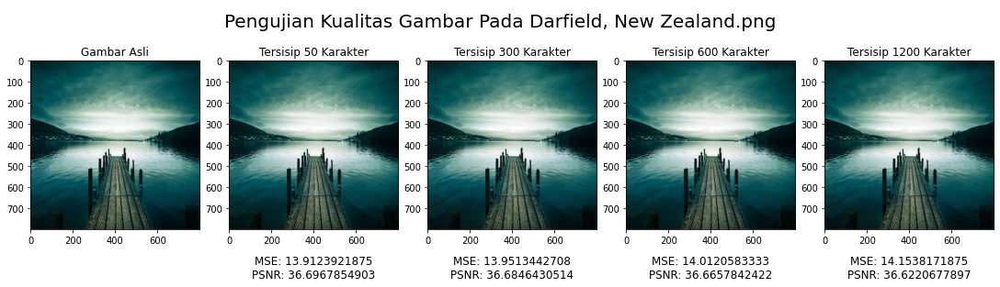

In [16]:
filename = original_f[13][9:]
metrics_50 = calculate_metrics(original_f[13], mod50_f[13])
metrics_300 = calculate_metrics(original_f[13], mod300_f[13])
metrics_600 = calculate_metrics(original_f[13], mod600_f[13])
metrics_1200 = calculate_metrics(original_f[13], mod1200_f[13])
store_metrics_result(filename, result=(metrics_50, metrics_300, metrics_600, metrics_1200))
show_images(
    image_path=[original_f[13], mod50_f[13], mod300_f[13], mod600_f[13], mod1200_f[13]],
    title_list=[f"Gambar Asli", f"Tersisip 50 Karakter", f"Tersisip 300 Karakter", f"Tersisip 600 Karakter",
                f"Tersisip 1200 Karakter"],
    subtitle=[metrics_50, metrics_300, metrics_600, metrics_1200],
    plot_title=f"Pengujian Kualitas Gambar Pada {filename}"
)

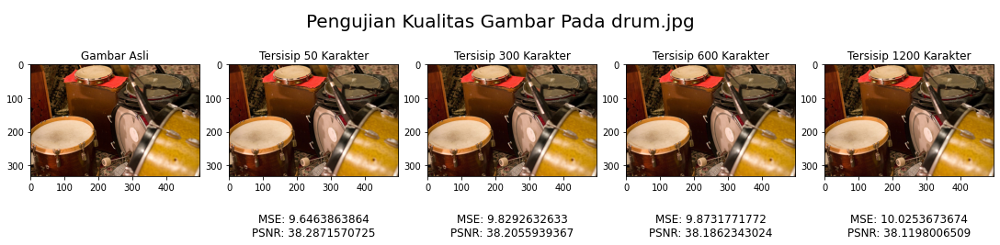

In [17]:
filename = original_f[14][9:]
metrics_50 = calculate_metrics(original_f[14], mod50_f[14])
metrics_300 = calculate_metrics(original_f[14], mod300_f[14])
metrics_600 = calculate_metrics(original_f[14], mod600_f[14])
metrics_1200 = calculate_metrics(original_f[14], mod1200_f[14])
store_metrics_result(filename, result=(metrics_50, metrics_300, metrics_600, metrics_1200))
show_images(
    image_path=[original_f[14], mod50_f[14], mod300_f[14], mod600_f[14], mod1200_f[14]],
    title_list=[f"Gambar Asli", f"Tersisip 50 Karakter", f"Tersisip 300 Karakter", f"Tersisip 600 Karakter",
                f"Tersisip 1200 Karakter"],
    subtitle=[metrics_50, metrics_300, metrics_600, metrics_1200],
    plot_title=f"Pengujian Kualitas Gambar Pada {filename}"
)

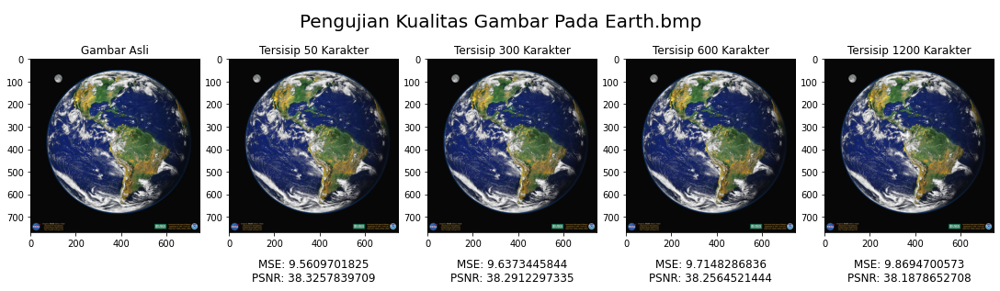

In [18]:
filename = original_f[15][9:]
metrics_50 = calculate_metrics(original_f[15], mod50_f[15])
metrics_300 = calculate_metrics(original_f[15], mod300_f[15])
metrics_600 = calculate_metrics(original_f[15], mod600_f[15])
metrics_1200 = calculate_metrics(original_f[15], mod1200_f[15])
store_metrics_result(filename, result=(metrics_50, metrics_300, metrics_600, metrics_1200))
show_images(
    image_path=[original_f[15], mod50_f[15], mod300_f[15], mod600_f[15], mod1200_f[15]],
    title_list=[f"Gambar Asli", f"Tersisip 50 Karakter", f"Tersisip 300 Karakter", f"Tersisip 600 Karakter",
                f"Tersisip 1200 Karakter"],
    subtitle=[metrics_50, metrics_300, metrics_600, metrics_1200],
    plot_title=f"Pengujian Kualitas Gambar Pada {filename}"
)

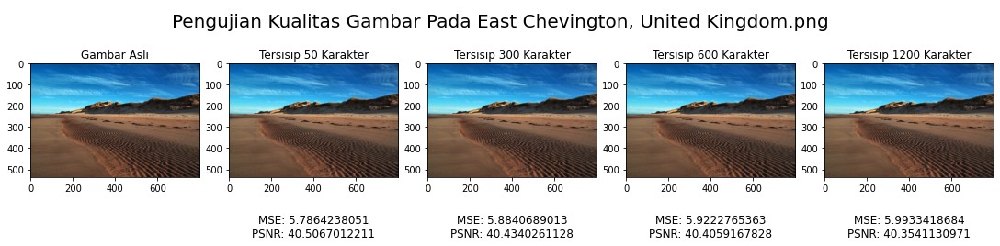

In [19]:
filename = original_f[16][9:]
metrics_50 = calculate_metrics(original_f[16], mod50_f[16])
metrics_300 = calculate_metrics(original_f[16], mod300_f[16])
metrics_600 = calculate_metrics(original_f[16], mod600_f[16])
metrics_1200 = calculate_metrics(original_f[16], mod1200_f[16])
store_metrics_result(filename, result=(metrics_50, metrics_300, metrics_600, metrics_1200))
show_images(
    image_path=[original_f[16], mod50_f[16], mod300_f[16], mod600_f[16], mod1200_f[16]],
    title_list=[f"Gambar Asli", f"Tersisip 50 Karakter", f"Tersisip 300 Karakter", f"Tersisip 600 Karakter",
                f"Tersisip 1200 Karakter"],
    subtitle=[metrics_50, metrics_300, metrics_600, metrics_1200],
    plot_title=f"Pengujian Kualitas Gambar Pada {filename}"
)

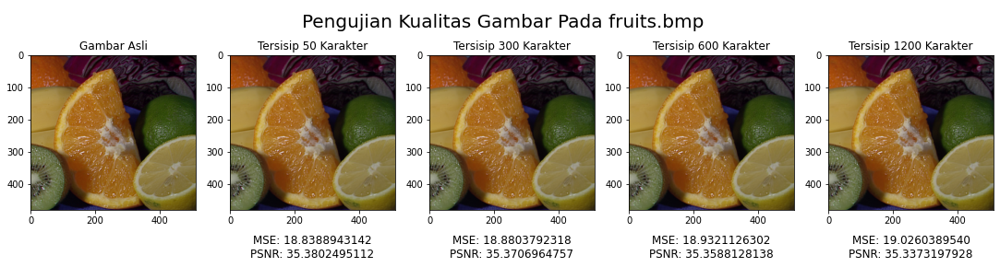

In [20]:
filename = original_f[17][9:]
metrics_50 = calculate_metrics(original_f[17], mod50_f[17])
metrics_300 = calculate_metrics(original_f[17], mod300_f[17])
metrics_600 = calculate_metrics(original_f[17], mod600_f[17])
metrics_1200 = calculate_metrics(original_f[17], mod1200_f[17])
store_metrics_result(filename, result=(metrics_50, metrics_300, metrics_600, metrics_1200))
show_images(
    image_path=[original_f[17], mod50_f[17], mod300_f[17], mod600_f[17], mod1200_f[17]],
    title_list=[f"Gambar Asli", f"Tersisip 50 Karakter", f"Tersisip 300 Karakter", f"Tersisip 600 Karakter",
                f"Tersisip 1200 Karakter"],
    subtitle=[metrics_50, metrics_300, metrics_600, metrics_1200],
    plot_title=f"Pengujian Kualitas Gambar Pada {filename}"
)

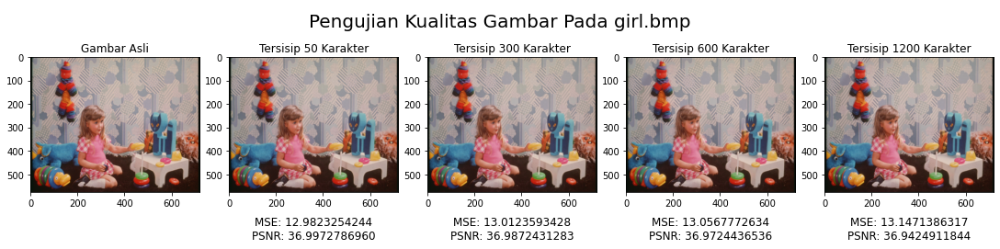

In [21]:
filename = original_f[18][9:]
metrics_50 = calculate_metrics(original_f[18], mod50_f[18])
metrics_300 = calculate_metrics(original_f[18], mod300_f[18])
metrics_600 = calculate_metrics(original_f[18], mod600_f[18])
metrics_1200 = calculate_metrics(original_f[18], mod1200_f[18])
store_metrics_result(filename, result=(metrics_50, metrics_300, metrics_600, metrics_1200))
show_images(
    image_path=[original_f[18], mod50_f[18], mod300_f[18], mod600_f[18], mod1200_f[18]],
    title_list=[f"Gambar Asli", f"Tersisip 50 Karakter", f"Tersisip 300 Karakter", f"Tersisip 600 Karakter",
                f"Tersisip 1200 Karakter"],
    subtitle=[metrics_50, metrics_300, metrics_600, metrics_1200],
    plot_title=f"Pengujian Kualitas Gambar Pada {filename}"
)

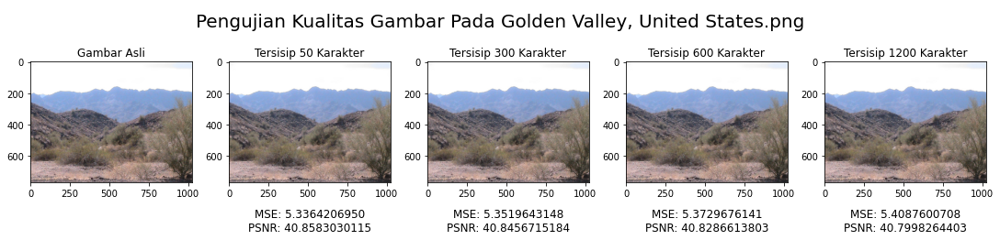

In [22]:
filename = original_f[19][9:]
metrics_50 = calculate_metrics(original_f[19], mod50_f[19])
metrics_300 = calculate_metrics(original_f[19], mod300_f[19])
metrics_600 = calculate_metrics(original_f[19], mod600_f[19])
metrics_1200 = calculate_metrics(original_f[19], mod1200_f[19])
store_metrics_result(filename, result=(metrics_50, metrics_300, metrics_600, metrics_1200))
show_images(
    image_path=[original_f[19], mod50_f[19], mod300_f[19], mod600_f[19], mod1200_f[19]],
    title_list=[f"Gambar Asli", f"Tersisip 50 Karakter", f"Tersisip 300 Karakter", f"Tersisip 600 Karakter",
                f"Tersisip 1200 Karakter"],
    subtitle=[metrics_50, metrics_300, metrics_600, metrics_1200],
    plot_title=f"Pengujian Kualitas Gambar Pada {filename}"
)

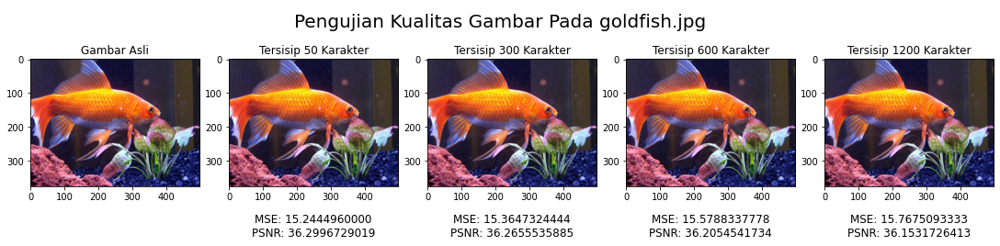

In [23]:
filename = original_f[20][9:]
metrics_50 = calculate_metrics(original_f[20], mod50_f[20])
metrics_300 = calculate_metrics(original_f[20], mod300_f[20])
metrics_600 = calculate_metrics(original_f[20], mod600_f[20])
metrics_1200 = calculate_metrics(original_f[20], mod1200_f[20])
store_metrics_result(filename, result=(metrics_50, metrics_300, metrics_600, metrics_1200))
show_images(
    image_path=[original_f[20], mod50_f[20], mod300_f[20], mod600_f[20], mod1200_f[20]],
    title_list=[f"Gambar Asli", f"Tersisip 50 Karakter", f"Tersisip 300 Karakter", f"Tersisip 600 Karakter",
                f"Tersisip 1200 Karakter"],
    subtitle=[metrics_50, metrics_300, metrics_600, metrics_1200],
    plot_title=f"Pengujian Kualitas Gambar Pada {filename}"
)

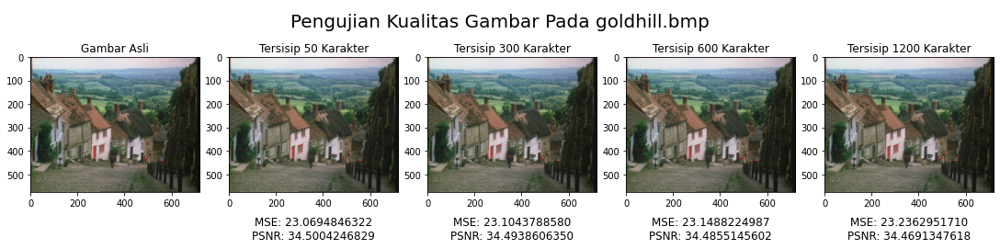

In [24]:
filename = original_f[21][9:]
metrics_50 = calculate_metrics(original_f[21], mod50_f[21])
metrics_300 = calculate_metrics(original_f[21], mod300_f[21])
metrics_600 = calculate_metrics(original_f[21], mod600_f[21])
metrics_1200 = calculate_metrics(original_f[21], mod1200_f[21])
store_metrics_result(filename, result=(metrics_50, metrics_300, metrics_600, metrics_1200))
show_images(
    image_path=[original_f[21], mod50_f[21], mod300_f[21], mod600_f[21], mod1200_f[21]],
    title_list=[f"Gambar Asli", f"Tersisip 50 Karakter", f"Tersisip 300 Karakter", f"Tersisip 600 Karakter",
                f"Tersisip 1200 Karakter"],
    subtitle=[metrics_50, metrics_300, metrics_600, metrics_1200],
    plot_title=f"Pengujian Kualitas Gambar Pada {filename}"
)

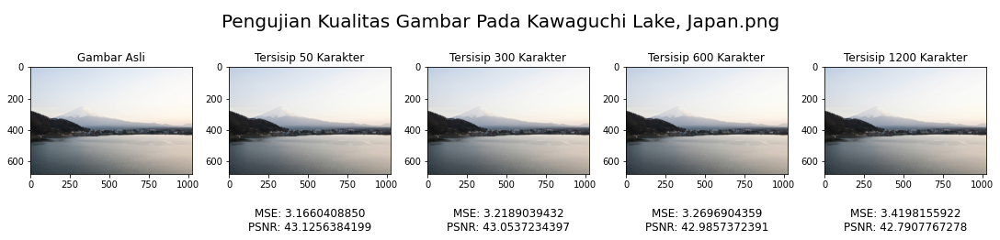

In [25]:
filename = original_f[22][9:]
metrics_50 = calculate_metrics(original_f[22], mod50_f[22])
metrics_300 = calculate_metrics(original_f[22], mod300_f[22])
metrics_600 = calculate_metrics(original_f[22], mod600_f[22])
metrics_1200 = calculate_metrics(original_f[22], mod1200_f[22])
store_metrics_result(filename, result=(metrics_50, metrics_300, metrics_600, metrics_1200))
show_images(
    image_path=[original_f[22], mod50_f[22], mod300_f[22], mod600_f[22], mod1200_f[22]],
    title_list=[f"Gambar Asli", f"Tersisip 50 Karakter", f"Tersisip 300 Karakter", f"Tersisip 600 Karakter",
                f"Tersisip 1200 Karakter"],
    subtitle=[metrics_50, metrics_300, metrics_600, metrics_1200],
    plot_title=f"Pengujian Kualitas Gambar Pada {filename}"
)

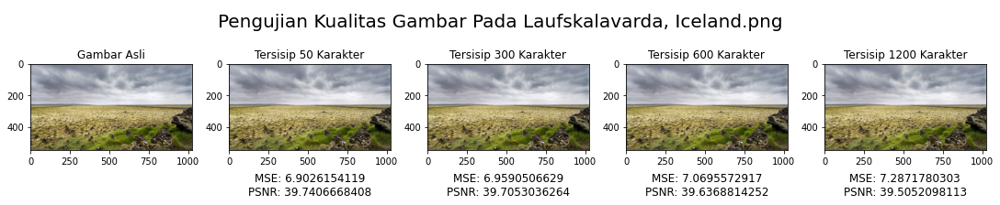

In [26]:
filename = original_f[23][9:]
metrics_50 = calculate_metrics(original_f[23], mod50_f[23])
metrics_300 = calculate_metrics(original_f[23], mod300_f[23])
metrics_600 = calculate_metrics(original_f[23], mod600_f[23])
metrics_1200 = calculate_metrics(original_f[23], mod1200_f[23])
store_metrics_result(filename, result=(metrics_50, metrics_300, metrics_600, metrics_1200))
show_images(
    image_path=[original_f[23], mod50_f[23], mod300_f[23], mod600_f[23], mod1200_f[23]],
    title_list=[f"Gambar Asli", f"Tersisip 50 Karakter", f"Tersisip 300 Karakter", f"Tersisip 600 Karakter",
                f"Tersisip 1200 Karakter"],
    subtitle=[metrics_50, metrics_300, metrics_600, metrics_1200],
    plot_title=f"Pengujian Kualitas Gambar Pada {filename}"
)

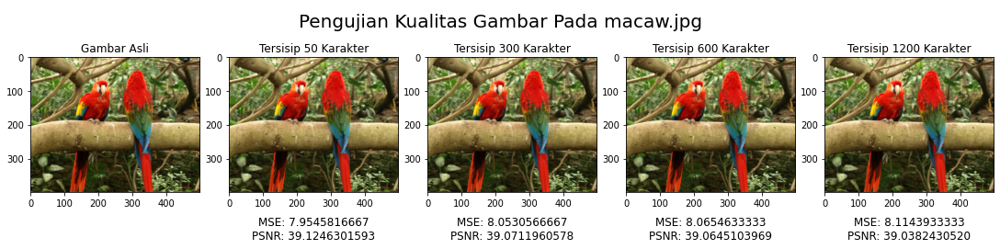

In [27]:
filename = original_f[24][9:]
metrics_50 = calculate_metrics(original_f[24], mod50_f[24])
metrics_300 = calculate_metrics(original_f[24], mod300_f[24])
metrics_600 = calculate_metrics(original_f[24], mod600_f[24])
metrics_1200 = calculate_metrics(original_f[24], mod1200_f[24])
store_metrics_result(filename, result=(metrics_50, metrics_300, metrics_600, metrics_1200))
show_images(
    image_path=[original_f[24], mod50_f[24], mod300_f[24], mod600_f[24], mod1200_f[24]],
    title_list=[f"Gambar Asli", f"Tersisip 50 Karakter", f"Tersisip 300 Karakter", f"Tersisip 600 Karakter",
                f"Tersisip 1200 Karakter"],
    subtitle=[metrics_50, metrics_300, metrics_600, metrics_1200],
    plot_title=f"Pengujian Kualitas Gambar Pada {filename}"
)

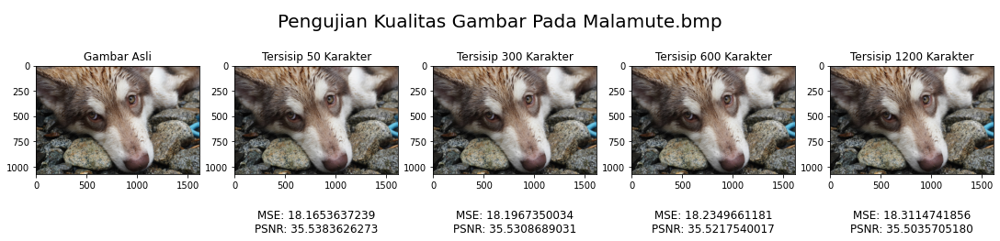

In [28]:
filename = original_f[25][9:]
metrics_50 = calculate_metrics(original_f[25], mod50_f[25])
metrics_300 = calculate_metrics(original_f[25], mod300_f[25])
metrics_600 = calculate_metrics(original_f[25], mod600_f[25])
metrics_1200 = calculate_metrics(original_f[25], mod1200_f[25])
store_metrics_result(filename, result=(metrics_50, metrics_300, metrics_600, metrics_1200))
show_images(
    image_path=[original_f[25], mod50_f[25], mod300_f[25], mod600_f[25], mod1200_f[25]],
    title_list=[f"Gambar Asli", f"Tersisip 50 Karakter", f"Tersisip 300 Karakter", f"Tersisip 600 Karakter",
                f"Tersisip 1200 Karakter"],
    subtitle=[metrics_50, metrics_300, metrics_600, metrics_1200],
    plot_title=f"Pengujian Kualitas Gambar Pada {filename}"
)

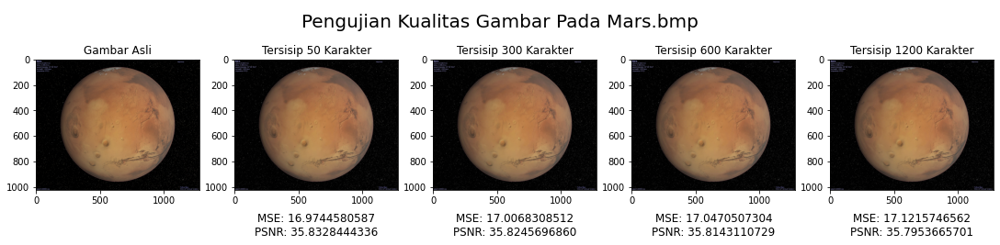

In [29]:
filename = original_f[26][9:]
metrics_50 = calculate_metrics(original_f[26], mod50_f[26])
metrics_300 = calculate_metrics(original_f[26], mod300_f[26])
metrics_600 = calculate_metrics(original_f[26], mod600_f[26])
metrics_1200 = calculate_metrics(original_f[26], mod1200_f[26])
store_metrics_result(filename, result=(metrics_50, metrics_300, metrics_600, metrics_1200))
show_images(
    image_path=[original_f[26], mod50_f[26], mod300_f[26], mod600_f[26], mod1200_f[26]],
    title_list=[f"Gambar Asli", f"Tersisip 50 Karakter", f"Tersisip 300 Karakter", f"Tersisip 600 Karakter",
                f"Tersisip 1200 Karakter"],
    subtitle=[metrics_50, metrics_300, metrics_600, metrics_1200],
    plot_title=f"Pengujian Kualitas Gambar Pada {filename}"
)

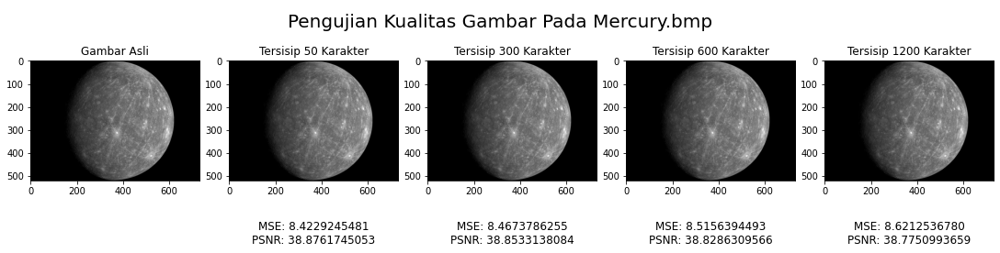

In [30]:
filename = original_f[27][9:]
metrics_50 = calculate_metrics(original_f[27], mod50_f[27])
metrics_300 = calculate_metrics(original_f[27], mod300_f[27])
metrics_600 = calculate_metrics(original_f[27], mod600_f[27])
metrics_1200 = calculate_metrics(original_f[27], mod1200_f[27])
store_metrics_result(filename, result=(metrics_50, metrics_300, metrics_600, metrics_1200))
show_images(
    image_path=[original_f[27], mod50_f[27], mod300_f[27], mod600_f[27], mod1200_f[27]],
    title_list=[f"Gambar Asli", f"Tersisip 50 Karakter", f"Tersisip 300 Karakter", f"Tersisip 600 Karakter",
                f"Tersisip 1200 Karakter"],
    subtitle=[metrics_50, metrics_300, metrics_600, metrics_1200],
    plot_title=f"Pengujian Kualitas Gambar Pada {filename}"
)

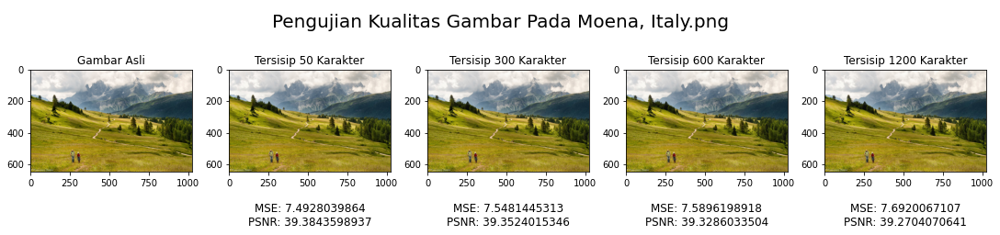

In [31]:
filename = original_f[28][9:]
metrics_50 = calculate_metrics(original_f[28], mod50_f[28])
metrics_300 = calculate_metrics(original_f[28], mod300_f[28])
metrics_600 = calculate_metrics(original_f[28], mod600_f[28])
metrics_1200 = calculate_metrics(original_f[28], mod1200_f[28])
store_metrics_result(filename, result=(metrics_50, metrics_300, metrics_600, metrics_1200))
show_images(
    image_path=[original_f[28], mod50_f[28], mod300_f[28], mod600_f[28], mod1200_f[28]],
    title_list=[f"Gambar Asli", f"Tersisip 50 Karakter", f"Tersisip 300 Karakter", f"Tersisip 600 Karakter",
                f"Tersisip 1200 Karakter"],
    subtitle=[metrics_50, metrics_300, metrics_600, metrics_1200],
    plot_title=f"Pengujian Kualitas Gambar Pada {filename}"
)

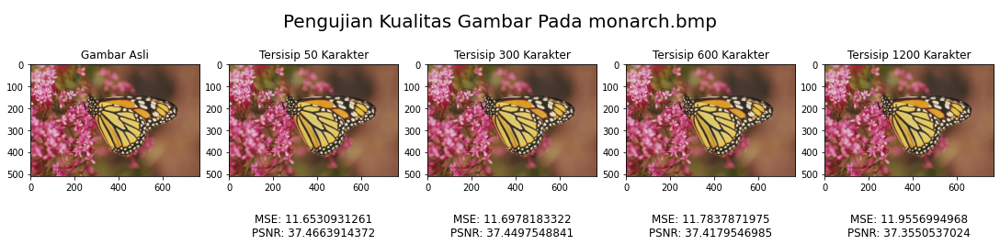

In [32]:
filename = original_f[29][9:]
metrics_50 = calculate_metrics(original_f[29], mod50_f[29])
metrics_300 = calculate_metrics(original_f[29], mod300_f[29])
metrics_600 = calculate_metrics(original_f[29], mod600_f[29])
metrics_1200 = calculate_metrics(original_f[29], mod1200_f[29])
store_metrics_result(filename, result=(metrics_50, metrics_300, metrics_600, metrics_1200))
show_images(
    image_path=[original_f[29], mod50_f[29], mod300_f[29], mod600_f[29], mod1200_f[29]],
    title_list=[f"Gambar Asli", f"Tersisip 50 Karakter", f"Tersisip 300 Karakter", f"Tersisip 600 Karakter",
                f"Tersisip 1200 Karakter"],
    subtitle=[metrics_50, metrics_300, metrics_600, metrics_1200],
    plot_title=f"Pengujian Kualitas Gambar Pada {filename}"
)

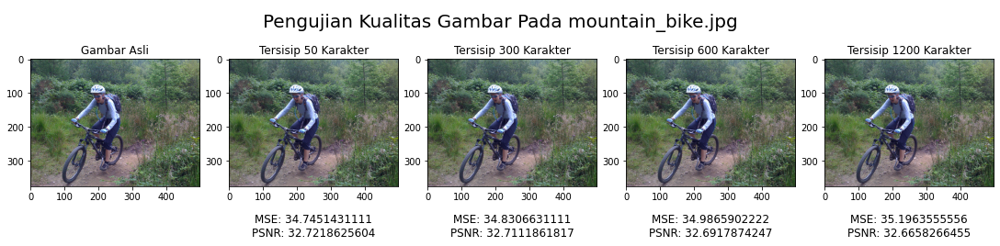

In [33]:
filename = original_f[30][9:]
metrics_50 = calculate_metrics(original_f[30], mod50_f[30])
metrics_300 = calculate_metrics(original_f[30], mod300_f[30])
metrics_600 = calculate_metrics(original_f[30], mod600_f[30])
metrics_1200 = calculate_metrics(original_f[30], mod1200_f[30])
store_metrics_result(filename, result=(metrics_50, metrics_300, metrics_600, metrics_1200))
show_images(
    image_path=[original_f[30], mod50_f[30], mod300_f[30], mod600_f[30], mod1200_f[30]],
    title_list=[f"Gambar Asli", f"Tersisip 50 Karakter", f"Tersisip 300 Karakter", f"Tersisip 600 Karakter",
                f"Tersisip 1200 Karakter"],
    subtitle=[metrics_50, metrics_300, metrics_600, metrics_1200],
    plot_title=f"Pengujian Kualitas Gambar Pada {filename}"
)

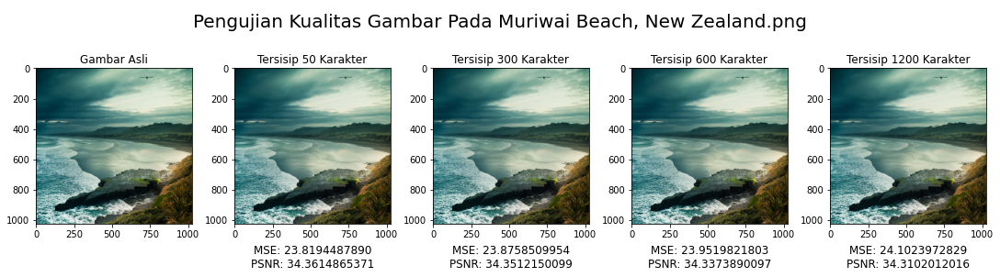

In [34]:
filename = original_f[31][9:]
metrics_50 = calculate_metrics(original_f[31], mod50_f[31])
metrics_300 = calculate_metrics(original_f[31], mod300_f[31])
metrics_600 = calculate_metrics(original_f[31], mod600_f[31])
metrics_1200 = calculate_metrics(original_f[31], mod1200_f[31])
store_metrics_result(filename, result=(metrics_50, metrics_300, metrics_600, metrics_1200))
show_images(
    image_path=[original_f[31], mod50_f[31], mod300_f[31], mod600_f[31], mod1200_f[31]],
    title_list=[f"Gambar Asli", f"Tersisip 50 Karakter", f"Tersisip 300 Karakter", f"Tersisip 600 Karakter",
                f"Tersisip 1200 Karakter"],
    subtitle=[metrics_50, metrics_300, metrics_600, metrics_1200],
    plot_title=f"Pengujian Kualitas Gambar Pada {filename}"
)

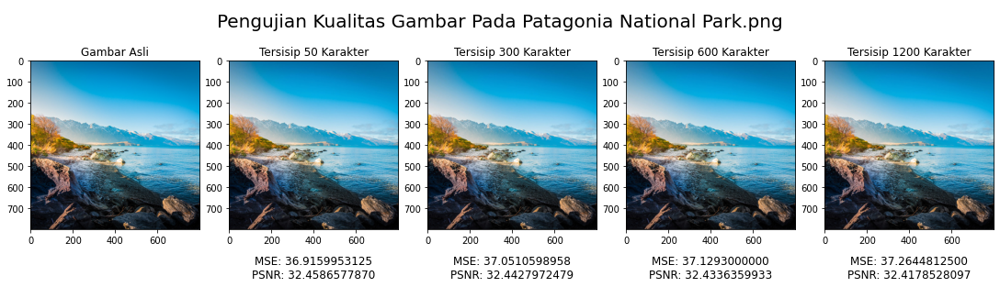

In [35]:
filename = original_f[32][9:]
metrics_50 = calculate_metrics(original_f[32], mod50_f[32])
metrics_300 = calculate_metrics(original_f[32], mod300_f[32])
metrics_600 = calculate_metrics(original_f[32], mod600_f[32])
metrics_1200 = calculate_metrics(original_f[32], mod1200_f[32])
store_metrics_result(filename, result=(metrics_50, metrics_300, metrics_600, metrics_1200))
show_images(
    image_path=[original_f[32], mod50_f[32], mod300_f[32], mod600_f[32], mod1200_f[32]],
    title_list=[f"Gambar Asli", f"Tersisip 50 Karakter", f"Tersisip 300 Karakter", f"Tersisip 600 Karakter",
                f"Tersisip 1200 Karakter"],
    subtitle=[metrics_50, metrics_300, metrics_600, metrics_1200],
    plot_title=f"Pengujian Kualitas Gambar Pada {filename}"
)

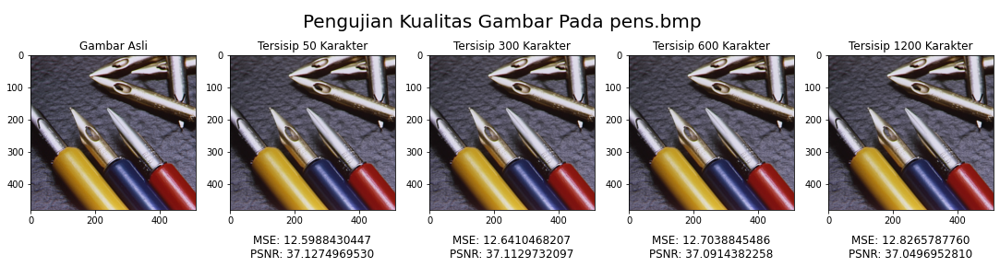

In [36]:
filename = original_f[33][9:]
metrics_50 = calculate_metrics(original_f[33], mod50_f[33])
metrics_300 = calculate_metrics(original_f[33], mod300_f[33])
metrics_600 = calculate_metrics(original_f[33], mod600_f[33])
metrics_1200 = calculate_metrics(original_f[33], mod1200_f[33])
store_metrics_result(filename, result=(metrics_50, metrics_300, metrics_600, metrics_1200))
show_images(
    image_path=[original_f[33], mod50_f[33], mod300_f[33], mod600_f[33], mod1200_f[33]],
    title_list=[f"Gambar Asli", f"Tersisip 50 Karakter", f"Tersisip 300 Karakter", f"Tersisip 600 Karakter",
                f"Tersisip 1200 Karakter"],
    subtitle=[metrics_50, metrics_300, metrics_600, metrics_1200],
    plot_title=f"Pengujian Kualitas Gambar Pada {filename}"
)

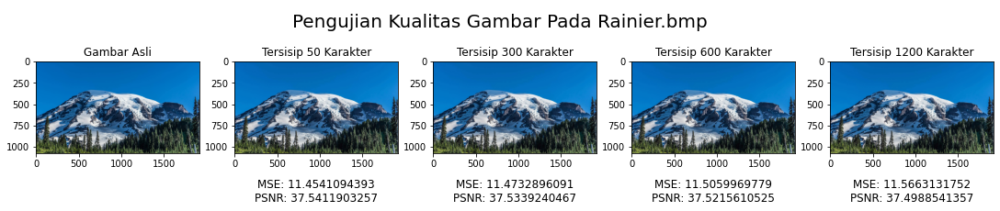

In [37]:
filename = original_f[34][9:]
metrics_50 = calculate_metrics(original_f[34], mod50_f[34])
metrics_300 = calculate_metrics(original_f[34], mod300_f[34])
metrics_600 = calculate_metrics(original_f[34], mod600_f[34])
metrics_1200 = calculate_metrics(original_f[34], mod1200_f[34])
store_metrics_result(filename, result=(metrics_50, metrics_300, metrics_600, metrics_1200))
show_images(
    image_path=[original_f[34], mod50_f[34], mod300_f[34], mod600_f[34], mod1200_f[34]],
    title_list=[f"Gambar Asli", f"Tersisip 50 Karakter", f"Tersisip 300 Karakter", f"Tersisip 600 Karakter",
                f"Tersisip 1200 Karakter"],
    subtitle=[metrics_50, metrics_300, metrics_600, metrics_1200],
    plot_title=f"Pengujian Kualitas Gambar Pada {filename}"
)

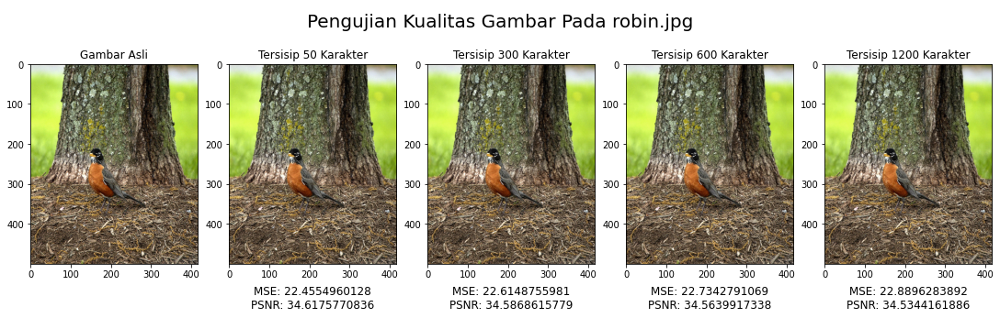

In [38]:
filename = original_f[35][9:]
metrics_50 = calculate_metrics(original_f[35], mod50_f[35])
metrics_300 = calculate_metrics(original_f[35], mod300_f[35])
metrics_600 = calculate_metrics(original_f[35], mod600_f[35])
metrics_1200 = calculate_metrics(original_f[35], mod1200_f[35])
store_metrics_result(filename, result=(metrics_50, metrics_300, metrics_600, metrics_1200))
show_images(
    image_path=[original_f[35], mod50_f[35], mod300_f[35], mod600_f[35], mod1200_f[35]],
    title_list=[f"Gambar Asli", f"Tersisip 50 Karakter", f"Tersisip 300 Karakter", f"Tersisip 600 Karakter",
                f"Tersisip 1200 Karakter"],
    subtitle=[metrics_50, metrics_300, metrics_600, metrics_1200],
    plot_title=f"Pengujian Kualitas Gambar Pada {filename}"
)

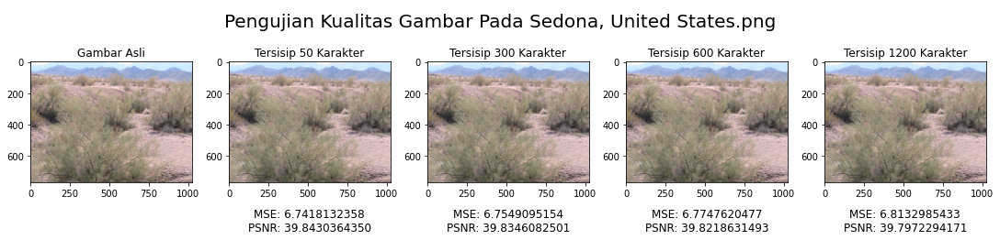

In [39]:
filename = original_f[36][9:]
metrics_50 = calculate_metrics(original_f[36], mod50_f[36])
metrics_300 = calculate_metrics(original_f[36], mod300_f[36])
metrics_600 = calculate_metrics(original_f[36], mod600_f[36])
metrics_1200 = calculate_metrics(original_f[36], mod1200_f[36])
store_metrics_result(filename, result=(metrics_50, metrics_300, metrics_600, metrics_1200))
show_images(
    image_path=[original_f[36], mod50_f[36], mod300_f[36], mod600_f[36], mod1200_f[36]],
    title_list=[f"Gambar Asli", f"Tersisip 50 Karakter", f"Tersisip 300 Karakter", f"Tersisip 600 Karakter",
                f"Tersisip 1200 Karakter"],
    subtitle=[metrics_50, metrics_300, metrics_600, metrics_1200],
    plot_title=f"Pengujian Kualitas Gambar Pada {filename}"
)

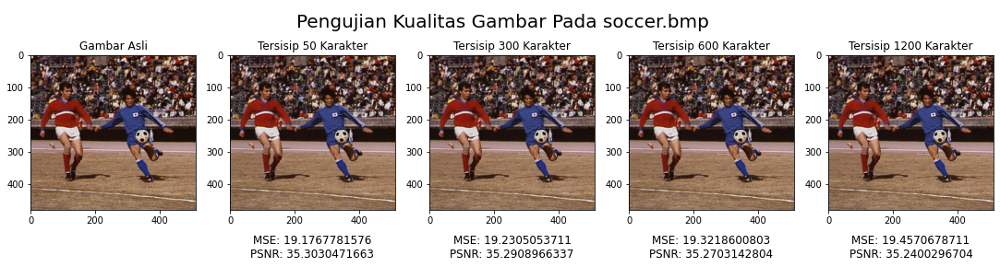

In [40]:
filename = original_f[37][9:]
metrics_50 = calculate_metrics(original_f[37], mod50_f[37])
metrics_300 = calculate_metrics(original_f[37], mod300_f[37])
metrics_600 = calculate_metrics(original_f[37], mod600_f[37])
metrics_1200 = calculate_metrics(original_f[37], mod1200_f[37])
store_metrics_result(filename, result=(metrics_50, metrics_300, metrics_600, metrics_1200))
show_images(
    image_path=[original_f[37], mod50_f[37], mod300_f[37], mod600_f[37], mod1200_f[37]],
    title_list=[f"Gambar Asli", f"Tersisip 50 Karakter", f"Tersisip 300 Karakter", f"Tersisip 600 Karakter",
                f"Tersisip 1200 Karakter"],
    subtitle=[metrics_50, metrics_300, metrics_600, metrics_1200],
    plot_title=f"Pengujian Kualitas Gambar Pada {filename}"
)

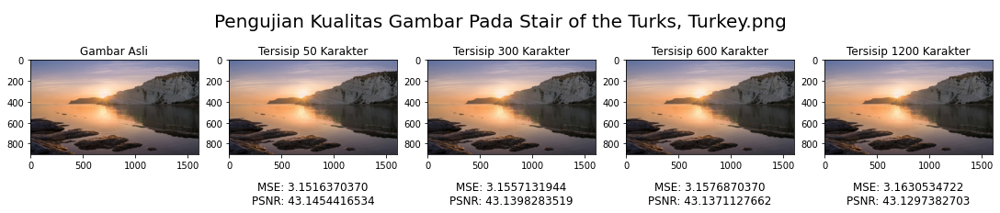

In [41]:
filename = original_f[38][9:]
metrics_50 = calculate_metrics(original_f[38], mod50_f[38])
metrics_300 = calculate_metrics(original_f[38], mod300_f[38])
metrics_600 = calculate_metrics(original_f[38], mod600_f[38])
metrics_1200 = calculate_metrics(original_f[38], mod1200_f[38])
store_metrics_result(filename, result=(metrics_50, metrics_300, metrics_600, metrics_1200))
show_images(
    image_path=[original_f[38], mod50_f[38], mod300_f[38], mod600_f[38], mod1200_f[38]],
    title_list=[f"Gambar Asli", f"Tersisip 50 Karakter", f"Tersisip 300 Karakter", f"Tersisip 600 Karakter",
                f"Tersisip 1200 Karakter"],
    subtitle=[metrics_50, metrics_300, metrics_600, metrics_1200],
    plot_title=f"Pengujian Kualitas Gambar Pada {filename}"
)

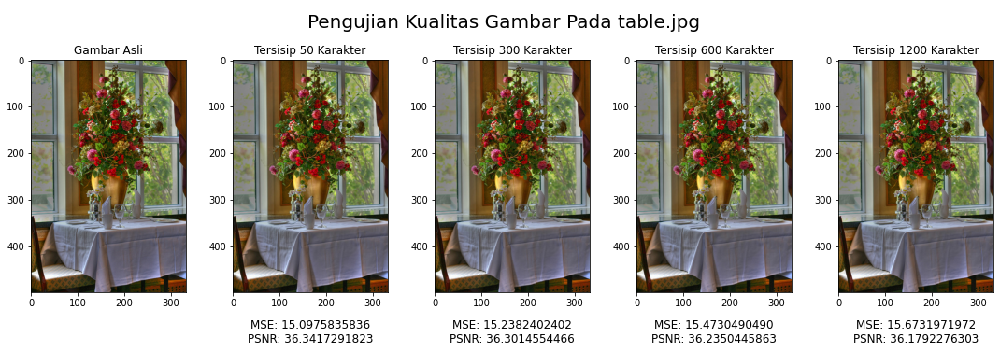

In [42]:
filename = original_f[39][9:]
metrics_50 = calculate_metrics(original_f[39], mod50_f[39])
metrics_300 = calculate_metrics(original_f[39], mod300_f[39])
metrics_600 = calculate_metrics(original_f[39], mod600_f[39])
metrics_1200 = calculate_metrics(original_f[39], mod1200_f[39])
store_metrics_result(filename, result=(metrics_50, metrics_300, metrics_600, metrics_1200))
show_images(
    image_path=[original_f[39], mod50_f[39], mod300_f[39], mod600_f[39], mod1200_f[39]],
    title_list=[f"Gambar Asli", f"Tersisip 50 Karakter", f"Tersisip 300 Karakter", f"Tersisip 600 Karakter",
                f"Tersisip 1200 Karakter"],
    subtitle=[metrics_50, metrics_300, metrics_600, metrics_1200],
    plot_title=f"Pengujian Kualitas Gambar Pada {filename}"
)

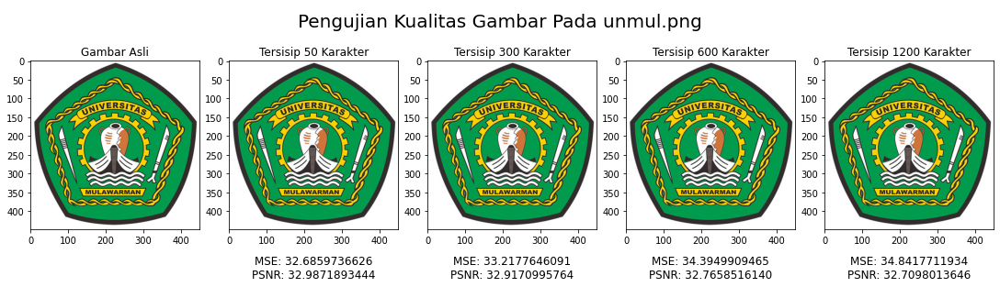

In [43]:
filename = original_f[40][9:]
metrics_50 = calculate_metrics(original_f[40], mod50_f[40])
metrics_300 = calculate_metrics(original_f[40], mod300_f[40])
metrics_600 = calculate_metrics(original_f[40], mod600_f[40])
metrics_1200 = calculate_metrics(original_f[40], mod1200_f[40])
store_metrics_result(filename, result=(metrics_50, metrics_300, metrics_600, metrics_1200))
show_images(
    image_path=[original_f[40], mod50_f[40], mod300_f[40], mod600_f[40], mod1200_f[40]],
    title_list=[f"Gambar Asli", f"Tersisip 50 Karakter", f"Tersisip 300 Karakter", f"Tersisip 600 Karakter",
                f"Tersisip 1200 Karakter"],
    subtitle=[metrics_50, metrics_300, metrics_600, metrics_1200],
    plot_title=f"Pengujian Kualitas Gambar Pada {filename}"
)

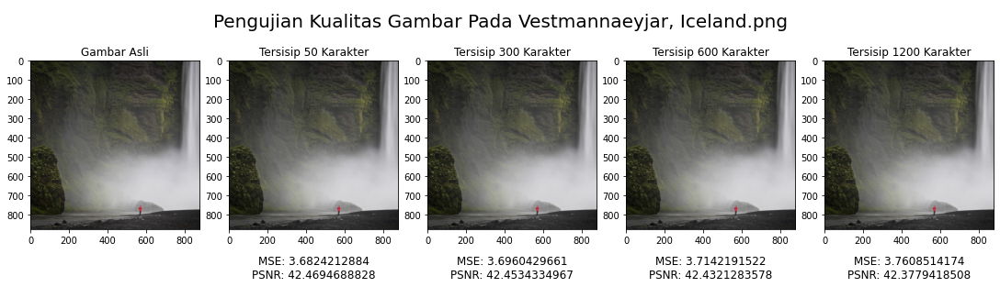

In [44]:
filename = original_f[41][9:]
metrics_50 = calculate_metrics(original_f[41], mod50_f[41])
metrics_300 = calculate_metrics(original_f[41], mod300_f[41])
metrics_600 = calculate_metrics(original_f[41], mod600_f[41])
metrics_1200 = calculate_metrics(original_f[41], mod1200_f[41])
store_metrics_result(filename, result=(metrics_50, metrics_300, metrics_600, metrics_1200))
show_images(
    image_path=[original_f[41], mod50_f[41], mod300_f[41], mod600_f[41], mod1200_f[41]],
    title_list=[f"Gambar Asli", f"Tersisip 50 Karakter", f"Tersisip 300 Karakter", f"Tersisip 600 Karakter",
                f"Tersisip 1200 Karakter"],
    subtitle=[metrics_50, metrics_300, metrics_600, metrics_1200],
    plot_title=f"Pengujian Kualitas Gambar Pada {filename}"
)

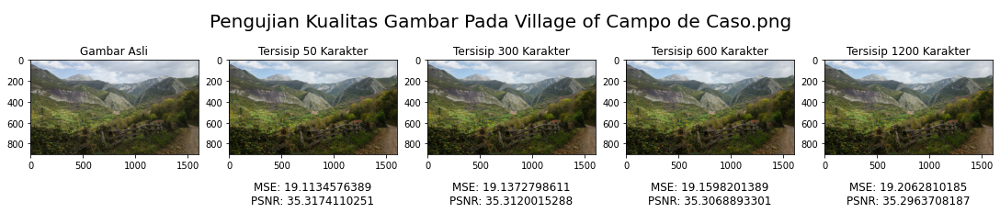

In [45]:
filename = original_f[42][9:]
metrics_50 = calculate_metrics(original_f[42], mod50_f[42])
metrics_300 = calculate_metrics(original_f[42], mod300_f[42])
metrics_600 = calculate_metrics(original_f[42], mod600_f[42])
metrics_1200 = calculate_metrics(original_f[42], mod1200_f[42])
store_metrics_result(filename, result=(metrics_50, metrics_300, metrics_600, metrics_1200))
show_images(
    image_path=[original_f[42], mod50_f[42], mod300_f[42], mod600_f[42], mod1200_f[42]],
    title_list=[f"Gambar Asli", f"Tersisip 50 Karakter", f"Tersisip 300 Karakter", f"Tersisip 600 Karakter",
                f"Tersisip 1200 Karakter"],
    subtitle=[metrics_50, metrics_300, metrics_600, metrics_1200],
    plot_title=f"Pengujian Kualitas Gambar Pada {filename}"
)

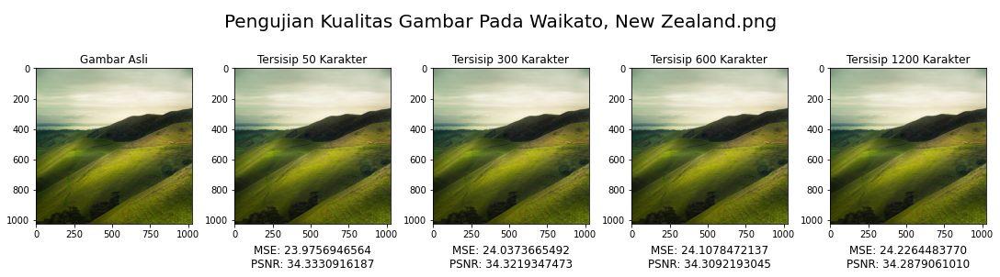

In [46]:
filename = original_f[43][9:]
metrics_50 = calculate_metrics(original_f[43], mod50_f[43])
metrics_300 = calculate_metrics(original_f[43], mod300_f[43])
metrics_600 = calculate_metrics(original_f[43], mod600_f[43])
metrics_1200 = calculate_metrics(original_f[43], mod1200_f[43])
store_metrics_result(filename, result=(metrics_50, metrics_300, metrics_600, metrics_1200))
show_images(
    image_path=[original_f[43], mod50_f[43], mod300_f[43], mod600_f[43], mod1200_f[43]],
    title_list=[f"Gambar Asli", f"Tersisip 50 Karakter", f"Tersisip 300 Karakter", f"Tersisip 600 Karakter",
                f"Tersisip 1200 Karakter"],
    subtitle=[metrics_50, metrics_300, metrics_600, metrics_1200],
    plot_title=f"Pengujian Kualitas Gambar Pada {filename}"
)

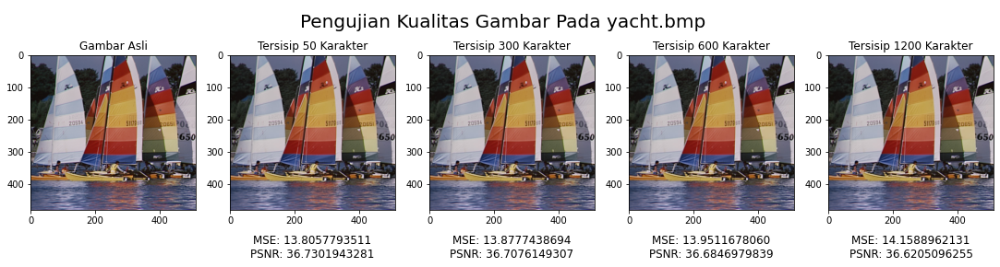

In [47]:
filename = original_f[44][9:]
metrics_50 = calculate_metrics(original_f[44], mod50_f[44])
metrics_300 = calculate_metrics(original_f[44], mod300_f[44])
metrics_600 = calculate_metrics(original_f[44], mod600_f[44])
metrics_1200 = calculate_metrics(original_f[44], mod1200_f[44])
store_metrics_result(filename, result=(metrics_50, metrics_300, metrics_600, metrics_1200))
show_images(
    image_path=[original_f[44], mod50_f[44], mod300_f[44], mod600_f[44], mod1200_f[44]],
    title_list=[f"Gambar Asli", f"Tersisip 50 Karakter", f"Tersisip 300 Karakter", f"Tersisip 600 Karakter",
                f"Tersisip 1200 Karakter"],
    subtitle=[metrics_50, metrics_300, metrics_600, metrics_1200],
    plot_title=f"Pengujian Kualitas Gambar Pada {filename}"
)

In [48]:

print(f"Banyaknya Data Uji: {len(array_results)} Gambar")

Banyaknya Data Uji: 45 Gambar


In [49]:
flatten_array_results = []
for array_result in array_results:
    mse_arr: list = array_result[1]
    psnr_arr: list = array_result[2]
    flatten_array_results.append([array_result[0], *mse_arr, *psnr_arr])

In [50]:
result_columns = [
    "Nama Gambar",
    "MSE Gambar Sisip 50 Karakter",
    "MSE Gambar Sisip 300 Karakter",
    "MSE Gambar Sisip 600 Karakter",
    "MSE Gambar Sisip 1200 Karakter",
    "PSNR Gambar Sisip 50 Karakter",
    "PSNR Gambar Sisip 300 Karakter",
    "PSNR Gambar Sisip 600 Karakter",
    "PSNR Gambar Sisip 1200 Karakter"
]
result_df = pd.DataFrame(data=flatten_array_results, columns=result_columns)
result_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45 entries, 0 to 44
Data columns (total 9 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   Nama Gambar                      45 non-null     object 
 1   MSE Gambar Sisip 50 Karakter     45 non-null     float64
 2   MSE Gambar Sisip 300 Karakter    45 non-null     float64
 3   MSE Gambar Sisip 600 Karakter    45 non-null     float64
 4   MSE Gambar Sisip 1200 Karakter   45 non-null     float64
 5   PSNR Gambar Sisip 50 Karakter    45 non-null     float64
 6   PSNR Gambar Sisip 300 Karakter   45 non-null     float64
 7   PSNR Gambar Sisip 600 Karakter   45 non-null     float64
 8   PSNR Gambar Sisip 1200 Karakter  45 non-null     float64
dtypes: float64(8), object(1)
memory usage: 3.3+ KB


In [51]:
result_df = result_df[[
    "Nama Gambar",
    "MSE Gambar Sisip 50 Karakter",
    "PSNR Gambar Sisip 50 Karakter",
    "MSE Gambar Sisip 300 Karakter",
    "PSNR Gambar Sisip 300 Karakter",
    "MSE Gambar Sisip 600 Karakter",
    "PSNR Gambar Sisip 600 Karakter",
    "MSE Gambar Sisip 1200 Karakter",    
    "PSNR Gambar Sisip 1200 Karakter"
]]
result_df

,Nama Gambar,MSE Gambar Sisip 50 Karakter,PSNR Gambar Sisip 50 Karakter,MSE Gambar Sisip 300 Karakter,PSNR Gambar Sisip 300 Karakter,MSE Gambar Sisip 600 Karakter,PSNR Gambar Sisip 600 Karakter,MSE Gambar Sisip 1200 Karakter,PSNR Gambar Sisip 1200 Karakter
0,airplane.bmp,13.685514,36.768193,13.737788,36.751636,13.861605,36.712668,14.072282,36.647158
1,airship.jpg,4.080322,42.023859,4.141851,41.958859,4.201452,41.896809,4.295356,41.800812
2,bagel.jpg,39.362024,32.180029,39.539673,32.160473,39.750804,32.137344,40.231950,32.085093
3,basketball.jpg,10.163251,38.060477,10.366956,37.974291,10.540747,37.902090,10.757721,37.813601
4,bookshop.jpg,11.239150,37.623469,11.309872,37.596227,11.362960,37.575889,11.487207,37.528659
5,cablecar.bmp,17.747616,35.639403,17.814402,35.623091,17.931303,35.594685,18.128799,35.547113
6,cannon.jpg,14.967435,36.379330,15.152459,36.325973,15.264784,36.293897,15.472642,36.235159
7,car.jpg,16.716713,35.899295,16.841284,35.867052,16.949280,35.839291,17.132251,35.792659
8,"Carrena, Spain.png",38.007364,32.332126,38.096596,32.321942,38.207285,32.309342,38.386943,32.288968
9,chicken.jpg,8.731542,38.719894,8.758125,38.706692,8.796752,38.687580,8.889465,38.642047


In [52]:
result_df.describe()

,MSE Gambar Sisip 50 Karakter,PSNR Gambar Sisip 50 Karakter,MSE Gambar Sisip 300 Karakter,PSNR Gambar Sisip 300 Karakter,MSE Gambar Sisip 600 Karakter,PSNR Gambar Sisip 600 Karakter,MSE Gambar Sisip 1200 Karakter,PSNR Gambar Sisip 1200 Karakter
count,45.000000,45.000000,45.000000,45.000000,45.000000,45.000000,45.000000,45.000000
mean,15.594902,37.022061,15.677171,36.995201,15.777667,36.967369,15.918706,36.921193
std,9.469030,2.821907,9.502381,2.814262,9.572993,2.812755,9.625920,2.797673
min,3.151637,32.180029,3.155713,32.160473,3.157687,32.137344,3.163053,32.085093
25%,8.731542,35.317411,8.758125,35.312002,8.796752,35.306889,8.889465,35.296371
50%,13.805779,36.730194,13.877744,36.707615,13.951168,36.684698,14.153817,36.622068
75%,19.113458,38.719894,19.137280,38.706692,19.159820,38.687580,19.206281,38.642047
max,39.362024,43.145442,39.539673,43.139828,39.750804,43.137113,40.231950,43.129738
